In [ ]:
#Original https://www.kaggle.com/code/farzadnekouei/pothole-segmentation-for-road-damage-assessment


In [ ]:
#Install ultranalytics
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.2/949.2 kB 24.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 69.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 15.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 33.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 34.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

### Imports


In [ ]:
import warnings
warnings.filterwarnings('ignore')
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import cv2
import yaml
from PIL import Image
from collections import deque
from ultralytics import YOLO
from IPython.display import Video

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


### Dataset - Github


In [ ]:
#Alternative downloads https://www.kaggle.com/datasets/farzadnekouei/pothole-image-segmentation-dataset
#https://universe.roboflow.com/farzad/pothole_segmentation_yolov8

!git clone https://github.com/bitwiserob/potholes.git


Cloning into 'potholes'...
remote: Enumerating objects: 11, done.
remote: Counting objects: 100% (8/8), done.
remote: Compressing objects: 100% (8/8), done.
remote: Total 11 (delta 0), reused 8 (delta 0), pack-reused 3 (from 1)
Receiving objects: 100% (11/11), 59.97 MiB | 33.07 MiB/s, done.


In [ ]:
!unzip potholes/potholes.zip


Archive:  potholes/potholes.zip
  inflating: Pothole_Segmentation_YOLOv8/README.dataset.txt  
  inflating: Pothole_Segmentation_YOLOv8/README.roboflow.txt  
  inflating: Pothole_Segmentation_YOLOv8/data.yaml  
  inflating: Pothole_Segmentation_YOLOv8/sample_video.mp4  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-1-_jpg.rf.49882cdb272111f43a6656b1494a4918.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-1-_jpg.rf.8d95dd1d29760a2634a45cc7fdd84b31.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-1-_jpg.rf.e238c9bf3fe82e8ac55b0014a27fc529.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-10-_jpg.rf.1d433d21e11d000b6b498eacb88fe4a9.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-10-_jpg.rf.500c683a687e403f4cdade4826a84b5b.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-10-_jpg.rf.5a901c212d899a7dc7dc78be7de892c0.jpg  
  inflating: Pothole_Segmentation_YOLOv8/train/images/pic-100-_jpg.rf.17047bb032a49c9

### Setup

In [ ]:
# Define the dataset_path, train and validation sets

dataset_path = '/content/Pothole_Segmentation_YOLOv8'
train_images_path = os.path.join(dataset_path, 'train', 'images')
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

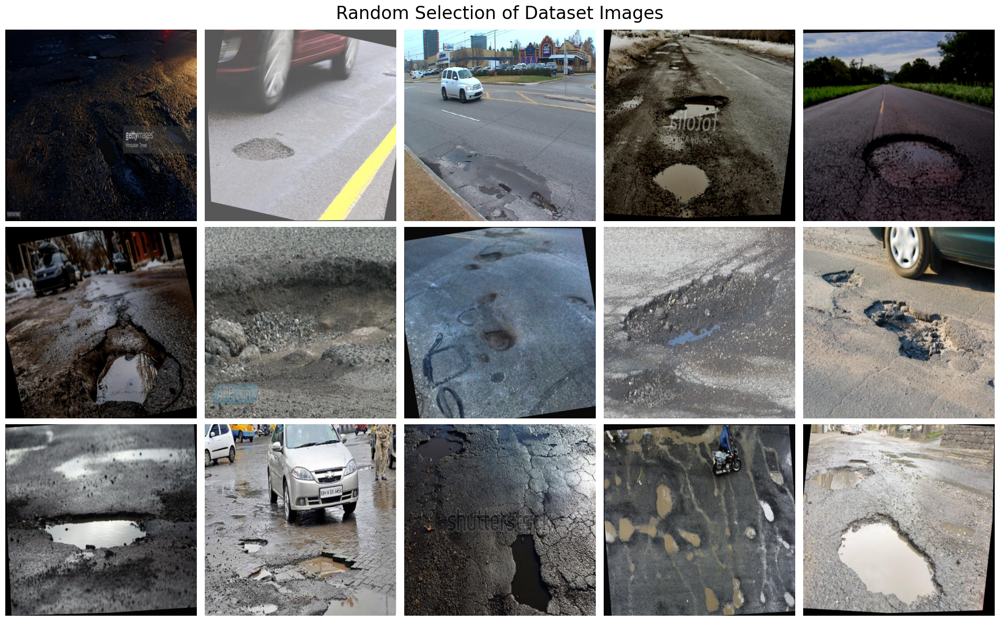

In [ ]:
# Set the seed for the random number generator
random.seed(0)

# Create a list of image files
image_files = [f for f in os.listdir(train_images_path) if f.endswith('.jpg')]

# Randomly select 15 images
random_images = random.sample(image_files, 15)

# Create a new figure
plt.figure(figsize=(19, 12))

# Loop through each image and display it in a 3x5 grid
for i, image_file in enumerate(random_images):
    image_path = os.path.join(train_images_path, image_file)
    image = Image.open(image_path)
    plt.subplot(3, 5, i + 1)
    plt.imshow(image)
    plt.axis('off')

# Add a suptitle
plt.suptitle('Random Selection of Dataset Images', fontsize=24)

# Show the plot
plt.tight_layout()
plt.show()

# Deleting unnecessary variable to free up memory
del image_files

In [ ]:
# Yolov8-seg is trained from COCO dataset
model = YOLO('yolo11n-seg.pt')


100%|██████████| 5.90M/5.90M [00:00<00:00, 109MB/s]


### Train

In [ ]:
results = model.train(data=dataset_path + '/data.yaml', epochs=10, imgsz=640,optimizer='Adam')


Ultralytics 8.3.91 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolo11n-seg.pt, data=/content/Pothole_Segmentation_YOLOv8/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, s

100%|██████████| 755k/755k [00:00<00:00, 19.6MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 96.0MB/s]


AMP: checks passed ✅


train: Scanning /content/Pothole_Segmentation_YOLOv8/train/labels... 720 images, 0 backgrounds, 0 corrupt: 100%|██████████| 720/720 [00:00<00:00, 1842.34it/s]


train: New cache created: /content/Pothole_Segmentation_YOLOv8/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/Pothole_Segmentation_YOLOv8/valid/labels... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<00:00, 997.40it/s]

val: New cache created: /content/Pothole_Segmentation_YOLOv8/valid/labels.cache


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: Adam(lr=0.01, momentum=0.937) with parameter groups 90 weight(decay=0.0), 101 weight(decay=0.0005), 100 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.79G      2.177      3.783      2.938      2.157         24        640: 100%|██████████| 45/45 [00:20<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.72it/s]

                   all         60        201          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/10      3.41G      2.279      3.505      2.561      2.278         42        640: 100%|██████████| 45/45 [00:16<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.24it/s]

                   all         60        201          0          0          0          0          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/10      3.42G      2.239      3.421      2.419      2.186         33        640: 100%|██████████| 45/45 [00:16<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.52it/s]

                   all         60        201    0.00104     0.0348   0.000572   0.000206    0.00182    0.00995   0.000463   9.18e-05



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/10      3.44G      2.066      3.229      2.185      2.056         54        640: 100%|██████████| 45/45 [00:15<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.55it/s]

                   all         60        201     0.0423      0.239     0.0219    0.00775     0.0232      0.144    0.00979    0.00313



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/10      3.46G      1.996      3.068      2.078      1.986         55        640: 100%|██████████| 45/45 [00:15<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         60        201      0.378      0.284      0.286      0.116      0.358      0.299      0.253      0.103



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/10      3.48G      1.858          3       1.99      1.877         34        640: 100%|██████████| 45/45 [00:15<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.48it/s]

                   all         60        201      0.591      0.368      0.454      0.222      0.605      0.363      0.457      0.211



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/10      3.49G      1.817      2.804      1.825      1.821         51        640: 100%|██████████| 45/45 [00:14<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.52it/s]

                   all         60        201      0.446      0.413      0.413      0.194      0.471      0.403      0.406      0.171



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/10      3.51G      1.743      2.727      1.762       1.77         48        640: 100%|██████████| 45/45 [00:15<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.70it/s]

                   all         60        201      0.579      0.393      0.443      0.201      0.585        0.4      0.435       0.19



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/10      3.53G      1.699      2.702      1.671       1.71         33        640: 100%|██████████| 45/45 [00:15<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         60        201      0.589      0.478      0.515      0.259      0.583      0.473      0.511       0.24



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/10      3.54G      1.644      2.596      1.599      1.677         36        640: 100%|██████████| 45/45 [00:15<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.59it/s]

                   all         60        201      0.601      0.572      0.583      0.302      0.643      0.582      0.594      0.296



10 epochs completed in 0.050 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 6.0MB
Optimizer stripped from runs/segment/train/weights/best.pt, 6.0MB

Validating runs/segment/train/weights/best.pt...
Ultralytics 8.3.91 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n-seg summary (fused): 113 layers, 2,834,763 parameters, 0 gradients, 10.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.51it/s]


                   all         60        201      0.603      0.575      0.582      0.303      0.642      0.579      0.594      0.296
Speed: 0.3ms preprocess, 3.2ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to runs/segment/train



image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-193-_jpg.rf.4520ff34079afc8e9f9b50a633c08876.jpg: 640x640 2 Potholes, 11.0ms
Speed: 4.4ms preprocess, 11.0ms inference, 11.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-28-_jpg.rf.fe8316c392940899d9211be3305c9ab6.jpg: 640x640 2 Potholes, 13.8ms
Speed: 4.1ms preprocess, 13.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-308-_jpg.rf.8f5b6dc0b616365d05bce17bf30eff39.jpg: 640x640 3 Potholes, 11.2ms
Speed: 1.6ms preprocess, 11.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLOv8/valid/images/pic-140-_jpg.rf.430bfe74decf2b904377d127914f2092.jpg: 640x640 1 Pothole, 11.2ms
Speed: 1.6ms preprocess, 11.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/Pothole_Segmentation_YOLO

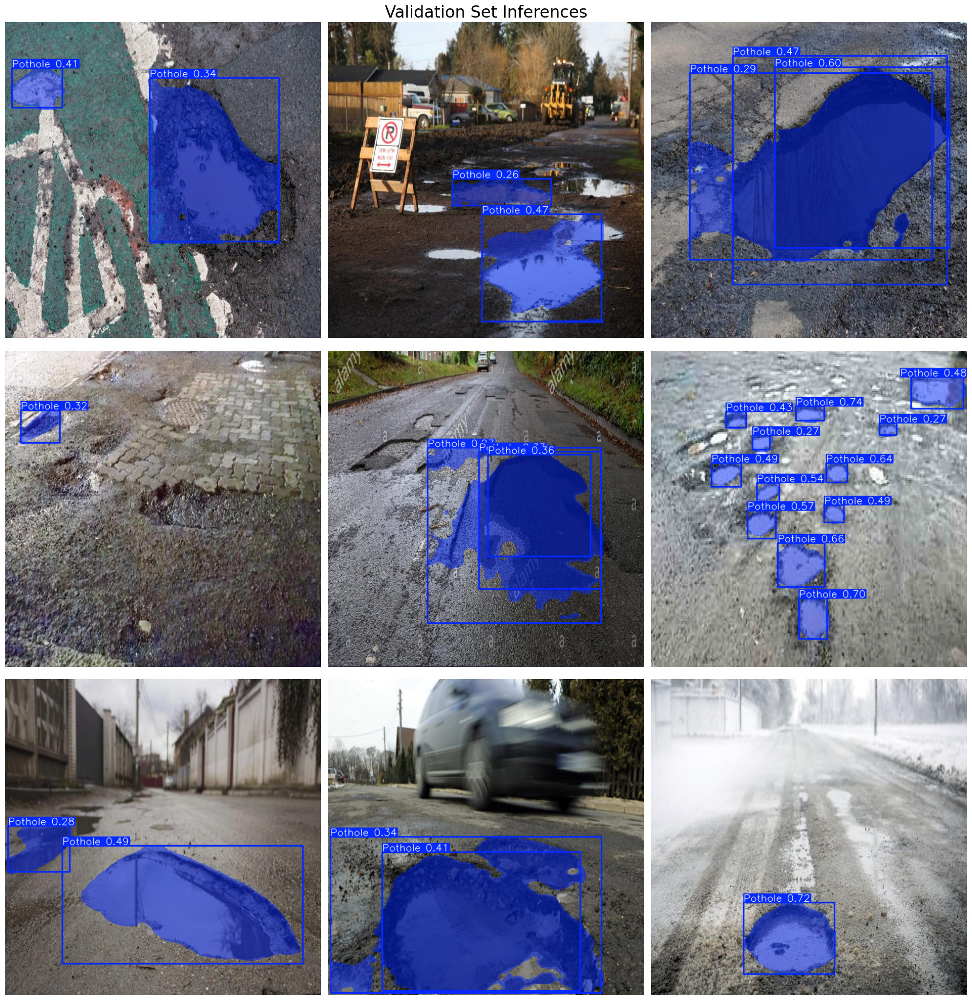

In [ ]:
# /content/runs/segment/train/weights/best.pt
best_model = YOLO('/content/runs/segment/train/weights/best.pt')


# Define the path to the validation images
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select 9 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

# Initialize the subplot
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = best_model.predict(source=image_path, imgsz=640)
    annotated_image = results[0].plot()
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()


image 1/1 /content/potholes/imgs/potholes.jpeg: 416x640 1 Pothole, 101.6ms
Speed: 2.9ms preprocess, 101.6ms inference, 3.4ms postprocess per image at shape (1, 3, 416, 640)


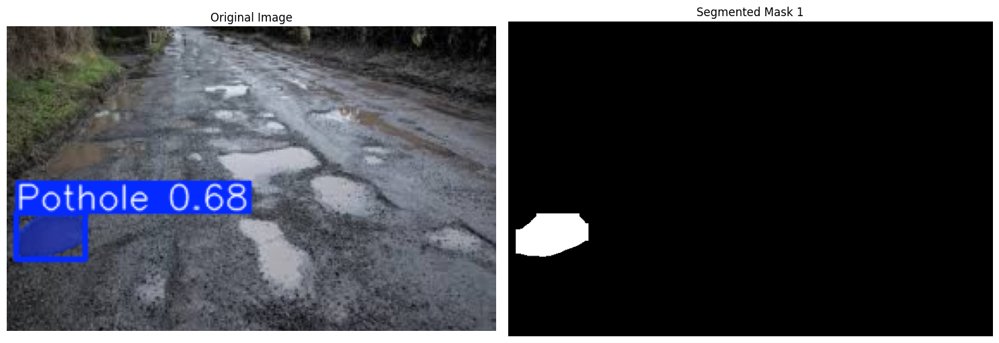

In [ ]:
image_path = '/content/potholes/imgs/potholes.jpeg'

#Inference
results = best_model.predict(source=image_path, imgsz=640, conf=0.5)
annotated_image = results[0].plot()
annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)

# Determine the number of subplots needed (1 original + number of masks)
num_subplots = 1 + (len(results[0].masks.data) if results[0].masks is not None else 0)

# Initialize the subplot with 1 row and n columns
fig, axes = plt.subplots(1, num_subplots, figsize=(15, 5))

# Display the original annotated image
axes[0].imshow(annotated_image_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')

# If multiple masks, iterate and display each mask
if results[0].masks is not None:
    masks = results[0].masks.data.cpu().numpy()
    for i, mask in enumerate(masks):
        # Threshold the mask to make sure it's binary
        # Any value greater than 0 is set to 255, else it remains 0
        binary_mask = (mask > 0).astype(np.uint8) * 255
        axes[i+1].imshow(binary_mask, cmap='gray')
        axes[i+1].set_title(f'Segmented Mask {i+1}')
        axes[i+1].axis('off')

# Adjust layout and display the subplot
plt.tight_layout()
plt.show()


image 1/1 /content/potholes/imgs/potholes2.jpg: 448x640 3 Potholes, 38.8ms
Speed: 4.0ms preprocess, 38.8ms inference, 3.3ms postprocess per image at shape (1, 3, 448, 640)


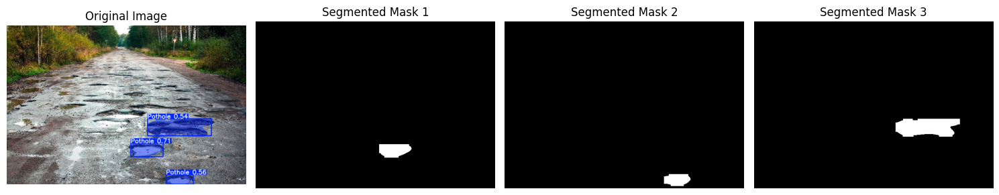

In [15]:
import cv2
import matplotlib.pyplot as plt

# Path to the image
image_path = '/content/potholes/imgs/potholes2.jpg'
results = best_model.predict(source=image_path, imgsz=640, conf=0.5)
annotated_image = results[0].plot()
annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)

# Determine the number of subplots
num_masks = len(results[0].masks.data) if results[0].masks is not None else 0
num_subplots = 1 + num_masks

fig, axes = plt.subplots(1, num_subplots, figsize=(15, 5))

# Ensure axes is a list
if num_subplots == 1:
    axes = [axes]

# Display the original annotated image
axes[0].imshow(annotated_image_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')

# Display the masks if they exist
if results[0].masks is not None:
    masks = results[0].masks.data.cpu().numpy()
    for i, mask in enumerate(masks):
        axes[i + 1].imshow(mask, cmap='gray')
        axes[i + 1].set_title(f'Segmented Mask {i + 1}')
        axes[i + 1].axis('off')

plt.tight_layout()
plt.show()


# SAM (Segment anything model)

### https://segment-anything.com/demo

### Meta repo: https://github.com/facebookresearch/segment-anything

### Ultralytics has a implementation


In [16]:
from ultralytics import SAM
import matplotlib.pyplot as plt
import cv2

# Load the model
model = SAM("sam_b.pt")

# Print model information
model.info()

# Run inference on the image with bounding box
results = model("/content/potholes/imgs/pothole.jpg",save=True)




Model summary: 173 layers, 93,735,472 parameters, 93,735,472 gradients

image 1/1 /content/potholes/imgs/pothole.jpg: 1024x1024 1 0, 1 1, 1 2, 1 3, 1 4, 1 5, 1 6, 1 7, 1 8, 1 9, 1 10, 1 11, 1 12, 1 13, 1 14, 1 15, 1 16, 1 17, 1 18, 1 19, 1 20, 1 21, 1 22, 1 23, 1 24, 1 25, 1 26, 1 27, 1 28, 1 29, 1 30, 10450.6ms
Speed: 4.4ms preprocess, 10450.6ms inference, 2.1ms postprocess per image at shape (1, 3, 1024, 1024)
Results saved to runs/segment/predict2


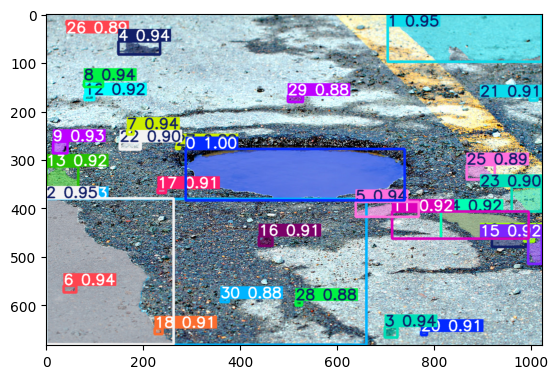

In [ ]:
annotated_image = results[0].plot()
annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)

plt.imshow(annotated_image_rgb)
plt.show()
